6/23/2022

Checking that this all works after putting the function definitions into StateUtils.jl

In [3]:
using Revise

In [4]:
using MKL
using JuliaSpectra
using BenchmarkTools
using Parameters
using Plots
using LinearAlgebra
BLAS.get_config()

LinearAlgebra.BLAS.LBTConfig
Libraries: 
└ [ILP64] mkl_rt.2.dll

In [5]:
const sol = 299792458
const h = 6.626e-34
const ħ = h / 2π
const μB = 4.66989733e-5 # in cm^-1/Gauss.
;

In [6]:
@unpack B, γ, bF, c = MolParams["YbOH"]["X"]
const BX = B
const γX = γ
const bFX = bF
const cX = c

@unpack B, aSO, p2q, T0 = MolParams["YbOH"]["A"]
const BA = B
const ASO = aSO
const p2qA = p2q
const T0_A = T0
;

In [7]:
# Build ground state
Hrot = BX * Rotation
Hsr = γX * SpinRotation
HX_op = Hrot+Hsr
bounds_X = (J = 1/2:101/2, I=1/2, Σ=[-1/2,1/2], Λ=0, Ω=[1/2,-1/2], S = 1/2, F=0:30)
basisX = enumerate_states(LinearCaseA, bounds_X)

Ho = T0_A * Origin
Hrot = BA * Rotation
HSO = ASO * SpinOrbit
Hld = p2qA * ΛDoubling_p2q
HA_op = Ho+Hrot+HSO+Hld
bounds_A = (J = 1/2:101/2, I=1/2, Σ=[-1/2,1/2], Λ=[-1,1], Ω=[1/2,-1/2,3/2,-3/2],S = 1/2, F=0:30)
basisA = enumerate_states(LinearCaseA, bounds_A)
;


In [8]:
HX = Hamiltonian(basis=basisX, H_operator = HX_op)
build(HX)
ground = blockbyconnected(HX)

HA = Hamiltonian(basis=basisA, H_operator = HA_op)
build(HA)
excited = blockbyconnected(HA)

TDMDict = makeTDMDict(ground, excited)

lout = makeLineList(ground, excited, TDMDict, 0; TK=10)

;

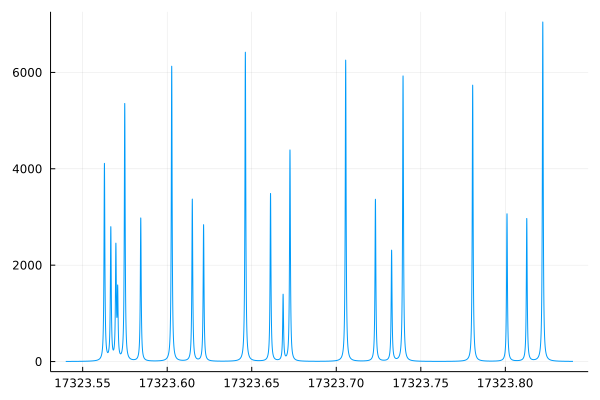

In [9]:
freq, amp = plotLineList(lout, 17323.54, 17323.84; gamma=0.0006, nstep= 90000)
plot(freq,amp)
plot!(legend=false)

In [12]:
xstate = makevibronicmanifold(basisX, [(BX, Rotation),(γX,SpinRotation),(bFX+cX/3, Hyperfine_IF),(cX/3,Hyperfine_Dipolar_c)])
astate = makevibronicmanifold(basisA, [(T0_A, Origin),(BA,Rotation),(p2qA,ΛDoubling_p2q),(ASO,SpinOrbit)])
;

In [13]:
TDMvibro = makeTDMvibronicmanifolds(xstate,astate)
TDMvibro[0]
;

In [14]:
xdict, xccs = makeblockedvibronicmanifold(xstate)
adict, accs = makeblockedvibronicmanifold(astate)
blockTDMDict = makeblockedTDMDict(xccs,accs,TDMvibro)
;

In [15]:
@btime makeblockedvibronicmanifold(xstate)
;

  2.338 ms (1276 allocations: 25.25 MiB)


In [16]:
lout2 = makeLineList(xdict, adict, blockTDMDict, 0; TK=10)
;

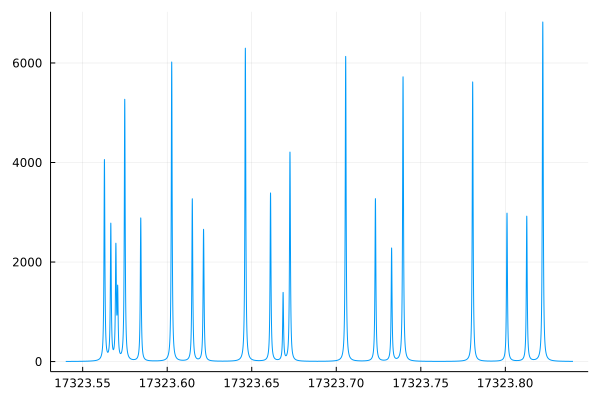

In [17]:
freq, amp = plotLineList(lout2, 17323.54, 17323.84; gamma=0.0006, nstep= 90000)
plot(freq,amp)
plot!(legend=false)

In [18]:
@unpack B, γ, bF, c = MolParams["YbOH"]["X"]
const BX = B
const γX = γ
const bFX = bF
const cX = c

@unpack B, aSO, p2q, T0 = MolParams["YbOH"]["A"]
const BA = B
const ASO = aSO
const p2qA = p2q
const T0_A = T0
;

  0.831196 seconds (2.63 M allocations: 2.365 GiB, 17.79% gc time, 0.32% compilation time)

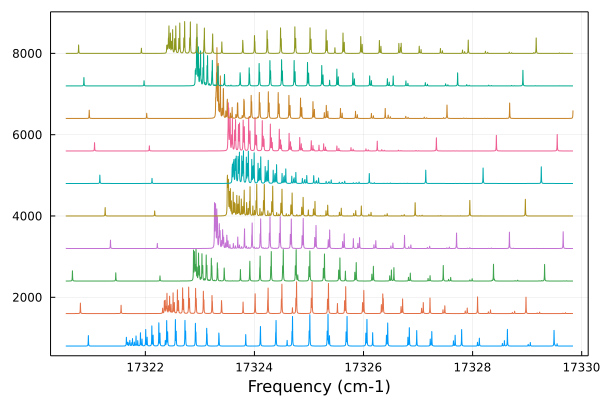

In [19]:
#Try the full sequence, including allowing some molecular parameter to vary... 

xstate = makevibronicmanifold(basisX, [(BX, Rotation),(γX,SpinRotation),(bFX+cX/3, Hyperfine_IF),(cX/3,Hyperfine_Dipolar_c)])
astate = makevibronicmanifold(basisA, [(T0_A, Origin),(BA,Rotation),(p2qA,ΛDoubling_p2q),(ASO,SpinOrbit)])

TDMvibro = makeTDMvibronicmanifolds(xstate,astate)

plot()
freq_out = []
amp_out = []
@time for (is,scale_fac) = enumerate(range(0, stop = 2., length=10))
    astate.prefactors[3] = p2qA * scale_fac
    xdict, xccs = makeblockedvibronicmanifold(xstate)
    adict, accs = makeblockedvibronicmanifold(astate)
    blockTDMDict = makeblockedTDMDict(xccs,accs,TDMvibro)

    lout2 = makeLineList(xdict, adict, blockTDMDict, 0; TK=10)

    freq, amp = plotLineList(lout2, 17320.54, 17329.84; gamma=0.006, nstep= 9000)
    push!(freq_out, freq)
    push!(amp_out, amp)
end
plot!(  [(freq_out[i], amp_out[i].+800*i) for i in 1:length(freq_out)],
        legend=false, 
        framestyle=:box,
        xlabel="Frequency (cm-1)",
    )



# Zeeman version

In [20]:
@unpack B, γ, bF, c, gS = MolParams["YbOH"]["X"]
const BX = B
const γX = γ
const bFX = bF
const cX = c
const gSX = gS

@unpack B, aSO, p2q, T0, gS, gL, gl′ = MolParams["YbOH"]["A"]
const BA = B
const ASO = aSO
const p2qA = p2q
const T0_A = T0
const gSA = gS
const gLA = gL
const gl′A = gl′
;

In [21]:
# Build ground state. This time include M in the basis.
Hrot = BX * Rotation
Hsr = γX * SpinRotation
HX_op = Hrot+Hsr
bounds_X = (J = 1/2:101/2, I=1/2, Σ=[-1/2,1/2], Λ=0, Ω=[1/2,-1/2], S = 1/2, F=0:6, M=-4:4)
basisX = enumerate_states(LinearCaseA_Field, bounds_X)

Ho = T0_A * Origin
Hrot = BA * Rotation
HSO = ASO * SpinOrbit
Hld = p2qA * ΛDoubling_p2q
HA_op = Ho+Hrot+HSO+Hld
bounds_A = (J = 1/2:101/2, I=1/2, Σ=[-1/2,1/2], Λ=[-1,1], Ω=[1/2,-1/2],S = 1/2, F=0:6, M=-4:4)
basisA = enumerate_states(LinearCaseA_Field, bounds_A)
;

In [22]:
xstate = makevibronicmanifold(basisX, [(BX, Rotation),(γX,SpinRotation),(bFX+cX/3, Hyperfine_IF),(cX/3,Hyperfine_Dipolar_c),
                                         (gSX*μB,Zeeman_S)])
astate = makevibronicmanifold(basisA, [(T0_A, Origin),(BA,Rotation),(p2qA,ΛDoubling_p2q), (ASO,SpinOrbit),
                                        (gSA*μB,Zeeman_S),(gLA*μB,Zeeman_L),(gl′A*μB, Zeeman_parity)])

TDMvibro = makeTDMvibronicmanifolds(xstate,astate)


Dict{Int64, Matrix{Float64}} with 3 entries:
  0  => [-0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 …
  -1 => [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 ……
  1  => [0.0 0.0 … 0.0 0.0; -0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 …

  0.379998 seconds (2.64 M allocations: 837.892 MiB, 12.28% gc time)


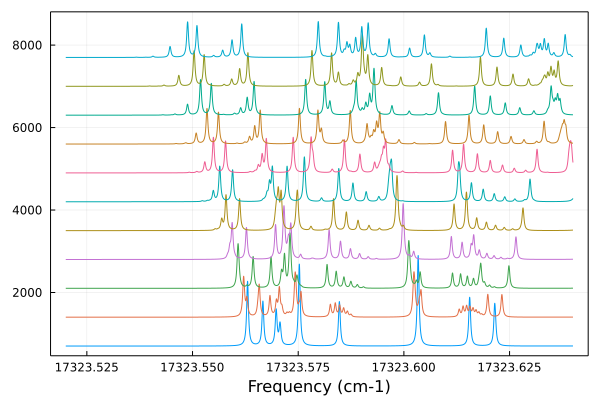

In [27]:
plot()
freq_out = []
amp_out = []
@time for (ib,B) = enumerate(range(0, step=50., length=11))
    xstate.prefactors[5] = gSX*μB*B
    astate.prefactors[5] = gSA*μB*B
    astate.prefactors[6] = gLA*μB*B
    astate.prefactors[7] = gl′A*μB*B
    xdict, xccs = makeblockedvibronicmanifold(xstate)
    adict, accs = makeblockedvibronicmanifold(astate)
    blockTDMDict = makeblockedTDMDict(xccs,accs,TDMvibro)

    lout2 = makeLineList(xdict, adict, blockTDMDict, 0; TK=8)

    freq, amp = plotLineList(lout2, 17323.52, 17323.64; gamma=0.0005, nstep= 10000)
    push!(freq_out, freq)
    push!(amp_out, amp)
end
plot!(  [(freq_out[i], amp_out[i].+700*i) for i in 1:length(freq_out)],
        legend=false, 
        framestyle=:box,
        xlabel="Frequency (cm-1)",
    )